# Analyzing Lava Flow Velocity with Python
#### Jasper Baur - RCES Final Project

In [1]:
#install packages
import pandas as pd
import xarray as xr
import numpy as np
import fsspec
#import h5netcdf

import urllib
import urllib.request
from urllib.request import urlopen


import IPython ## 
from IPython import display
display.set_matplotlib_formats('retina')
from IPython.display import Video
from IPython.display import YouTubeVideo
from IPython.display import Image
from IPython.core.display import HTML


import matplotlib.pyplot as plt 
from matplotlib import ticker, cm
%matplotlib inline  
%config InlineBackend.figure_format = "retina"
import matplotlib.image as mpimg
from matplotlib.pyplot import figure
from matplotlib import animation

import warnings




## Project Description:

This project aims to derive and analyze the velocity of a lava flow site at Fissure 8 from the 2018 Lower East Rift Zone of Kilauea in Hawaii,  from drone imagery collected by the USGS. This research is part of a larger project to understand and model multi-phase (lava, bubbles, and crystals) lava flows, and ultimatley better predict lava flow emplacement. Velocity vector fields are produced using particle image velocimetry (PIV), and analyzed through xarray. 

### Workflow:

More broadly, the scripts provided outline a workflow to derive and analyze surface velocity from drone video footage

1. Video_to_Frames: Input: Video Data -> Output: 1 second frames in form of jpeg or tiff
2. Frames_to_PIV: Input: Frame Images -> Output: Velocity fields in form of csv files for each image generated through OpenPIV - Particle Image Velocimetry
3. PIV_to_Xarray: Input: PIV csv files -> Output: Organizes data across time, space and drone flight dimensions. Converts velocity fields to m/s, and corrects for drone motion
4. Xarray_to_GIF: Input: Xarray -> Creates GIFs showing velocity for each frame and how it changes overtime 
5. final_project: Analyzes the velocity fields and creates figures to conceptualize data

(Note: only scripts for PIV_to_Xarray and final_project are compatible with Binder - others are meant to be downloaded and run on local drive)

### Scientific Questions:

- How can I accuratley extract lava flow surface velocity from drone footage?
- How does lava flow velocity at Site 6 change throughout a day?
- What is the average speed of the flows?
- Understaning the influence of channel width on the apparent velocity?

### Drone Video Raw Data example
Clip of UAS Flight 7 on 26th July 2018, at the Kilauea Lower East Rift Zone captured by the USGS HVO

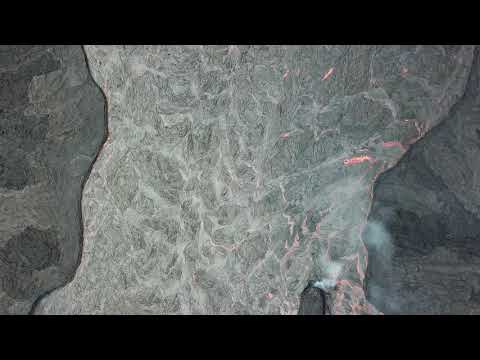

In [3]:
idd = 'TmSK4a4tl84'

YouTubeVideo(id=idd, width=800, height=500)

### Distilled Image Frames
#### Produced with Script 1_Video_to_Frame 

In [ ]:
direct = 'Users/Jasper/Volc_Research/Workflow_OPENPIV/1_Site_5_Frames/'

frame_F7 = plt.imread('DJI_0002_20180726_1308-Vpt4postTypeA_Trim-Copy1.MOV_000.jpg' , format='jpg')
#frame_F8  = plt.imread('DJI_0002_20180726_1335-Vpt5postTypeA-Copy1.MOV_000.jpg' , format='jpg')
#frame_F9  = plt.imread('DJI_0002_20180726_1405-Vpt5postTypeA-Copy1.MOV_000.jpg' , format='jpg')
#frame_F10 = plt.imread('DJI_0002_20180726_1440-Vpt5postTypeA-Copy1.MOV_000.jpg', format='jpg')

plt.imshow(frame_F7)

In [ ]:
plt.rcParams.update({'font.size': 15})
frame_F7 = plt.imread('DJI_0003_20180726_1308-Vpt5postTypeA_Trim-Copy1.MOV_000.jpg' , format='jpg')
frame_F8  = plt.imread('DJI_0002_20180726_1335-Vpt5postTypeA-Copy1.MOV_000.jpg' , format='jpg')
frame_F9  = plt.imread('DJI_0002_20180726_1405-Vpt5postTypeA-Copy1.MOV_000.jpg' , format='jpg')
frame_F10 = plt.imread('DJI_0002_20180726_1440-Vpt5postTypeA-Copy1.MOV_000.jpg', format='jpg')

fig,ax = plt.subplots(2,2,figsize=(20,15))
ax[0,0].imshow(frame_F7)
ax[0,0].set_title('Flight 7')
ax[0,1].imshow(frame_F8)
ax[0,1].set_title('Flight 8')
ax[1,0].imshow(frame_F9)
ax[1,0].set_title('Flight 9')
ax[1,1].imshow(frame_F10)
ax[1,1].set_title('Flight 10')
plt.tight_layout()

### Metadata 
#### Location: Site 4
Latitude: 19.469755 
Longitude: -154.908011


#### Date:  26 July 2018 
Start and end times HST

Flight 07: 12:53	13:08

Flight 08: 13:19	13:35

Flight 09: 13:48	14:05

Flight 10: 14:25	14:40

- Flights trimed to 2:00 min in pre-processing

## Turning Frames into Velocity Fields (csv files) then builing an Xarray and cleaning the data
#### Script:  2_Frames_to_PIV : Velocity Fields Generated with OpenPIV - Particle Image Velocimetry 
#### Script:  3_PIV_to_Xarray : Xarray built

### Make Conversions to real world units
- From Pixels/frame to Meters/Second
- Part of Script 3_PIV_to_Xarray but we will use the GSD later

In [5]:
AGL = 304.8 # meters ABove ground level 
FOV = np.deg2rad(78.8) #degrees (Field of View)
Aspect =  2160/3840   #aspect ratio 16:9 (Pixel Height/ Pixel Width of Image)

D =   2 * AGL *np.tan(FOV/2) #diagnol of image

A = (D) / np.sqrt(1 + Aspect**2)
B = Aspect * D / np.sqrt(1 + Aspect**2)
print('Image Footprint:',A, 'm x', B, 'm')

PixelX = 3840
PixelY = 2180


GSDx = A/ PixelX #(Ground Sampling Distance of x direction)
GSDy = B/ PixelY #(Ground Sampling Distance of y direction)

print('Ground Sampling Distance:', 'x:', GSDx, 'y:', GSDy)

Image Footprint: 436.4249645610448 m x 245.4890425655877 m
Ground Sampling Distance: x: 0.11365233452110542 y: 0.11260965255302188


## Load in Corrected Xarray dataset

In [2]:
#Pull From Google drive
#gdfidXR = '    '
#gdfsXR = gdrivefs.GoogleDriveFileSystem(root_file_id=gdfidXR, token ='cache')
#filesXr = gdfsXR.ls('')

dfx = xr.open_dataset('0726_Site4_Velocity_Fields.nc')

In [3]:
dfx.load()

<xarray.Dataset>
Dimensions:  (Flight: 4, time: 120, x: 119, y: 66)
Coordinates:
  * x        (x) float64 3.637 7.274 10.91 14.55 ... 421.9 425.5 429.2 432.8
  * y        (y) float64 3.604 7.207 10.81 14.41 ... 227.0 230.6 234.2 237.8
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 112 113 114 115 116 117 118 119
  * Flight   (Flight) object 'F07' 'F08' 'F09' 'F10'
Data variables:
    u        (Flight, time, x, y) float64 0.05169 0.06138 ... 0.03728 0.03153
    v        (Flight, time, x, y) float64 0.3545 0.3593 ... -0.01625 0.01285
    s        (Flight, time, x, y) float64 0.3583 0.3645 ... 0.04067 0.03405

### Xarray: 4 flights (F07, F08, F09, F10) each with 120 seconds 
- Each time has it's own velocity field
### Variables include 
- u: cross-stream velocity (- is left, + is right) (m/s)
- v: downstream velocity (m/s)
- s: total velocity (m/s)

### Data cleaning consisted of:
1. Combine all Flights into one Dataset with new dimension (Flight)
2. Make Conversions to real world units - From Pixels/frame to Meters/Second
3. Correcting For Drone Motion by subtracting out 'still region' velocities from entire field for each frame in each flight - this accounts for small drone motions cause by wind or turbulence
4. Add total velocity -  s = sqrt(u^2 + v^2)
5. Correct for spikes and drop outs with where function

### Select By Flights - Binder

In [11]:
#F07 = dfx.sel(Flight= b'F07')
#F08 = dfx.sel(Flight= b'F08')
#F09 = dfx.sel(Flight= b'F09')
#F10 = dfx.sel(Flight= b'F10')

### Select by Flights - JupyterNotebook

In [8]:
F07 = dfx.sel(Flight= 'F07')
F08 = dfx.sel(Flight= 'F08')
F09 = dfx.sel(Flight= 'F09')
F10 = dfx.sel(Flight= 'F10')

# Visualizing the Data

## Plots with time-mean velocities

#### Average Velocity, Average Downstream velocity, Maximum downstream veocity, Average cross-stream velocity

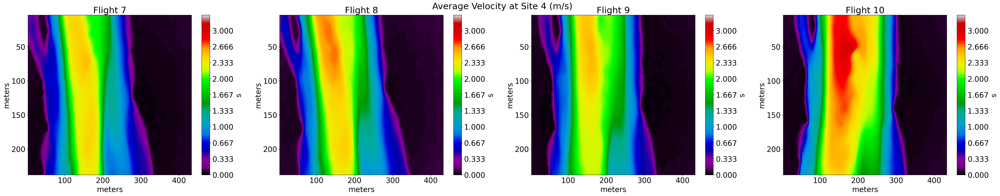

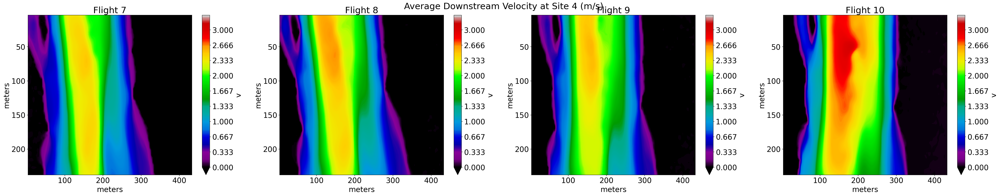

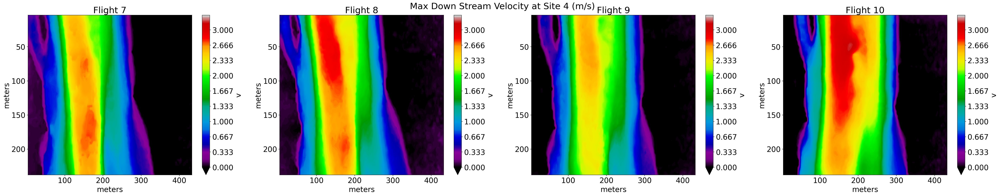

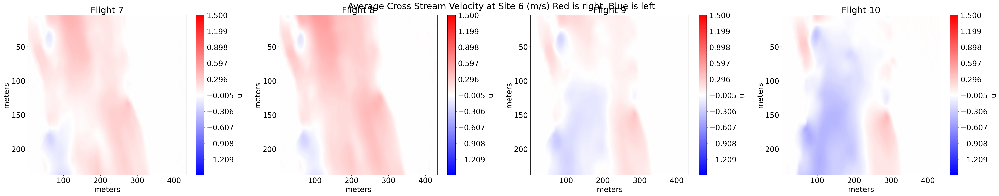

In [9]:
warnings.filterwarnings("ignore")
plt.rcParams.update({'font.size': 21})

# Average Velocity
fig1, axes = plt.subplots(figsize=(40, 8), ncols=4, )
ax1, ax2, ax3, ax4 =axes

plt.suptitle("Average Velocity at Site 4 (m/s)")

F7_cor_s = F07.s
F7_cor_s.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[0], yincrease=False)
ax1.set_title('Flight 7')
ax1.set_xlabel('meters')
ax1.set_ylabel('meters')
#ax1.set_xticks([0, .5, 1, 1.5, 2, 2.5, 3])


F8_cor_s = F08.s 
F8_cor_s.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[1], yincrease=False)
ax2.set_title('Flight 8')
ax2.set_xlabel('meters')
ax2.set_ylabel('meters')

F9_cor_s = F09.s 
F9_cor_s.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[2], yincrease=False)
#plt.gca().invert_yaxis()
ax3.set_title('Flight 9')
ax3.set_xlabel('meters')
ax3.set_ylabel('meters')

F10_cor_s = F10.s
F10_cor_s.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[3], yincrease=False)
ax4.set_title('Flight 10')
ax4.set_xlabel('meters')
ax4.set_ylabel('meters')
plt.tight_layout()


# Mean Down Stream Velocity
fig2, axes = plt.subplots(figsize=(40, 8), ncols=4, )
ax1, ax2, ax3, ax4 =axes

plt.suptitle(" Average Downstream Velocity at Site 4 (m/s)")


F07.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[0], yincrease=False)
ax1.set_title('Flight 7')
ax1.set_xlabel('meters')
ax1.set_ylabel('meters')

F08.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[1], yincrease=False)
ax2.set_title('Flight 8')
ax2.set_xlabel('meters')
ax2.set_ylabel('meters')

F09.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[2], yincrease=False)
ax3.set_title('Flight 9')
ax3.set_xlabel('meters')
ax3.set_ylabel('meters')

F10.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[3], yincrease=False)
ax4.set_title('Flight 10')
ax4.set_xlabel('meters')
ax4.set_ylabel('meters')
plt.tight_layout()

#Max downstream Velocity
fig3, axes = plt.subplots(figsize=(40, 8), ncols=4, )
ax1, ax2, ax3, ax4 =axes

plt.suptitle("Max Down Stream Velocity at Site 4 (m/s)")

# Due to drone motion, positively interfering with down stream velocity, we need to make a corrections
Cor_F07 = F07.v.max(dim='time') -.1
Cor_F07.transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[0], yincrease=False)
ax1.set_title('Flight 7')
ax1.set_xlabel('meters')
ax1.set_ylabel('meters')

Cor_F08 = F08.v.max(dim='time') -.1
Cor_F08.transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[1], yincrease=False)
ax2.set_title('Flight 8')
ax2.set_xlabel('meters')
ax2.set_ylabel('meters')

Cor_F09 = F09.v.max(dim='time') -.1
Cor_F09.transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[2], yincrease=False)
ax3.set_title('Flight 9')
ax3.set_xlabel('meters')
ax3.set_ylabel('meters')

Cor_F10 = F10.v.max(dim='time') -.1
Cor_F10.transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[3], yincrease=False)
ax4.set_title('Flight 10')
ax4.set_xlabel('meters')
ax4.set_ylabel('meters')
plt.tight_layout()

# Mean Cross Stream Velocity
fig4, axes = plt.subplots(figsize=(40, 8), ncols=4, )
ax1, ax2, ax3, ax4 =axes

plt.suptitle("Average Cross Stream Velocity at Site 6 (m/s) Red is right, Blue is left")

F07.u.mean(dim='time').transpose().plot.contourf(levels=300, vmin= -1.5, vmax=1.5, cmap=cm.bwr, ax=axes[0], yincrease=False)
ax1.set_title('Flight 7')
ax1.set_xlabel('meters')
ax1.set_ylabel('meters')

F08.u.mean(dim='time').transpose().plot.contourf(levels=300, vmin= -1.5, vmax=1.5, cmap=cm.bwr, ax=axes[1], yincrease=False)
ax2.set_title('Flight 8')
ax2.set_xlabel('meters')
ax2.set_ylabel('meters')

F09.u.mean(dim='time').transpose().plot.contourf(levels=300, vmin= -1.5, vmax=1.5, cmap=cm.bwr, ax=axes[2], yincrease=False)
ax3.set_title('Flight 9')
ax3.set_xlabel('meters')
ax3.set_ylabel('meters')

F10.u.mean(dim='time').transpose().plot.contourf(levels=300, vmin= -1.5, vmax=1.5, cmap=cm.bwr, ax=axes[3], yincrease=False)
ax4.set_title('Flight 10')
ax4.set_xlabel('meters')
ax4.set_ylabel('meters')
plt.tight_layout()

# Analysis

## Plots of Velocity through time at each channel

Main Channel Velocities
Mean thoughout time for the main channel at F7 is 2.352184774935334 m/s
Mean thoughout time for the main channel at F8 is 2.374290587927218 m/s
Mean thoughout time for the main channel at F9 is 2.2500535418108365 m/s
Mean thoughout time for the main channel at F10 is 2.5530033742181075 m/s
Small Channel Velocities
Mean thoughout time for the small channel at F7 is 0.172815729291296 m/s
Mean thoughout time for the small channel at F8 is 0.3994730348079042 m/s
Mean thoughout time for the small channel at F9 is 0.4126972777837172 m/s
Mean thoughout time for the small channel at F10 is 0.01441704424009994 m/s


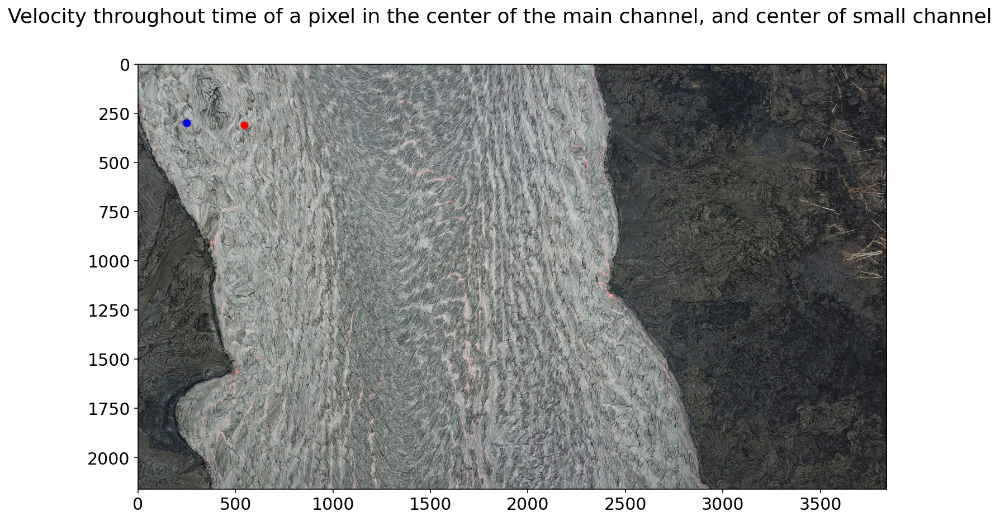

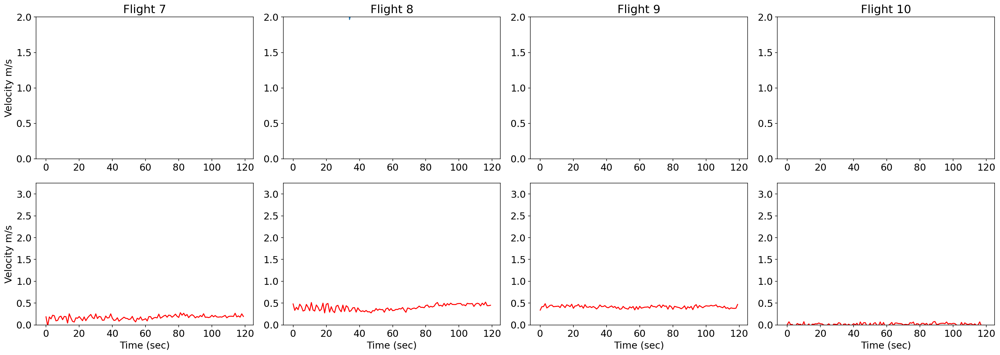

In [10]:
plt.rcParams.update({'font.size': 15})
warnings.filterwarnings("ignore")

#plot frame with dots
Resize =.2

fig0,ax = plt.subplots(figsize=(12,7))
plt.imshow(frame_F7,  aspect='auto')
plt.plot(250, 300, 'bo')
plt.plot(545,310, 'ro')
plt.suptitle("Velocity throughout time of a pixel in the center of the main channel, and center of small channel")



fig,ax = plt.subplots(2,4,figsize=(22,8))

#Flight7 
Large = F07.v.sel(x=150, y=150, method='nearest')

ax[0,0].plot(F07.time, Large)
ax[0,0].set_ylabel('Velocity m/s')
#ax[0,0].set_xlabel('Time (sec)')
ax[0,0].set_ylim(0,2)
ax[0,0].set_title('Flight 7')


# Pixel at center of smaller channel throughout 2 minutes 
Small = F07.v.sel(x=307, y=165, method='nearest')
ax[1,0].plot(F07.time, Small, color='red')
ax[1,0].set_ylim(0,3.25)
ax[1,0].set_ylabel('Velocity m/s')
ax[1,0].set_xlabel('Time (sec)')


#Flight 8

Large8 = F08.v.sel(x=150, y=160, method='nearest')
ax[0,1].plot(F08.time, Large8)
#ax[0,1].set_ylabel('Velocity m/s')
#ax[0,1].set_xlabel('Time (sec)')
ax[0,1].set_ylim(0,2)
ax[0,1].set_title('Flight 8')



# Pixel at center of smaller channel throughout 2 minutes 
Small8 = F08.v.sel(x=307, y=175, method='nearest')
ax[1,1].plot(F08.time, Small8, color='red')
ax[1,1].set_ylim(0,3.25)
#ax[1,1].set_ylabel('Velocity m/s')
ax[1,1].set_xlabel('Time (sec)')

#Flight 9

Large9 = F09.v.sel(x=143, y=170, method='nearest')

ax[0,2].plot(F09.time, Large9)
#ax[0,2].set_ylabel('Velocity m/s')
#ax[0,2].set_xlabel('Time (sec)')
ax[0,2].set_ylim(0,2)
ax[0,2].set_title('Flight 9')


# Pixel at center of smaller channel throughout 2 minutes 
Small9 = F09.v.sel(x=300, y=185, method='nearest')
ax[1,2].plot(F09.time, Small9, color='red')
ax[1,2].set_ylim(0,3.25)
#ax[1,2].set_ylabel('Velocity m/s')
ax[1,2].set_xlabel('Time (sec)')
#ax[2].set_title("Velocity Throughout time of a pixel in the center of the smaller channel")


#Flight 10


Large10 = F10.v.sel(x=160, y=180, method='nearest')


ax[0,3].plot(F10.time, Large10)
#ax[0,3].set_ylabel('Velocity m/s')
#ax[0,3].set_xlabel('Time (sec)')
ax[0,3].set_ylim(0,2)
ax[0,3].set_title('Flight 10')



# Pixel at center of smaller channel throughout 2 minutes 
Small10 = F10.v.sel(x=330, y=205, method='nearest')
ax[1,3].plot(F10.time, Small10, color='red')
ax[1,3].set_ylim(0,3.25)
#ax[1,3].set_ylabel('Velocity m/s')
ax[1,3].set_xlabel('Time (sec)')

plt.tight_layout()

print('Main Channel Velocities')

print('Mean thoughout time for the main channel at F7 is', Large.mean(dim='time').values, 'm/s')


print('Mean thoughout time for the main channel at F8 is', Large8.mean(dim='time').values, 'm/s')


print('Mean thoughout time for the main channel at F9 is', Large9.mean(dim='time').values, 'm/s')
print('Mean thoughout time for the main channel at F10 is', Large10.mean(dim='time').values, 'm/s')


print('Small Channel Velocities')
print('Mean thoughout time for the small channel at F7 is', Small.mean(dim='time').values, 'm/s')
print('Mean thoughout time for the small channel at F8 is', Small8.mean(dim='time').values, 'm/s')
print('Mean thoughout time for the small channel at F9 is', Small9.mean(dim='time').values, 'm/s')

print('Mean thoughout time for the small channel at F10 is', Small10.mean(dim='time').values, 'm/s')



Blue Dot: Slight Fluctuations likely due to error in PIV calculation and drone motion, but for the most part stable speed around F7: 1.34 m/s, F8: 1.50 m/s, F9: 1.64 m/s, 1.71 m/s.

Red Dot: Less stable then the wider channel, again fluctuations in velocity may be due to errors related to PIV method and drone motion, but larger fluctiations may indicate that the smaller channel did not have steady state flow, and the lava flow velocity varied between seconds. Looking at the gif below and the drone imagery this variation may be due to a chunk of rock in the middle of the smaller channel that induces a less stable flow regime. We see here that the mean velocity of a center pixel in the smaller stream is faster for each flight being 2.19 m/s, 2.24 m/s, 1.40 m/s,  2.52 m/s respectivly.

## Cross Channel Velocity Profiles

In [11]:
frame_F7.shape
#New image shape (430, 770, 3)
#original image shape (2160, 3840, 3)
(430/2160) , (770/3840)
Resize = .2 

Text(0, 0.5, 'meters')

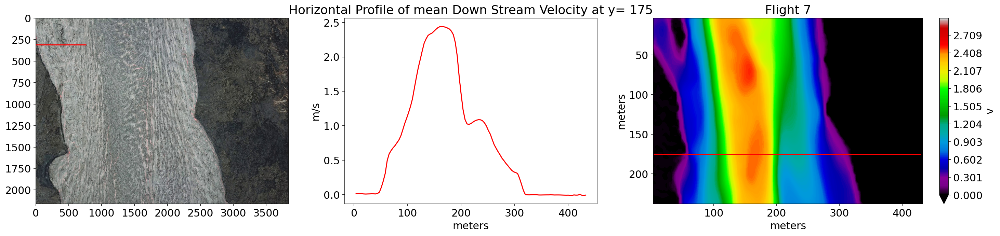

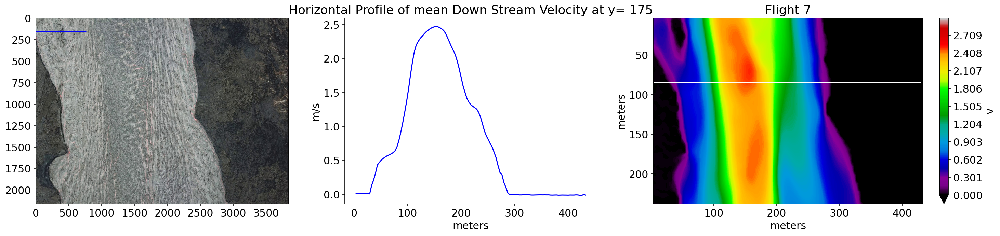

In [12]:
Cross = F07.v.mean(dim='time').sel(y=175, method='nearest')

fig,ax = plt.subplots(1,3,figsize=(25,5), gridspec_kw={'width_ratios': [3, 3, 4]})
ax[0].imshow(frame_F7,  aspect='auto')
ax[0].hlines(1554*Resize, 0, 3830*Resize, colors='red')

Cross.plot(ax=ax[1], color='red')
ax[1].set_title('Horizontal Profile of mean Down Stream Velocity at y= 175')
ax[1].set_ylabel('m/s')
ax[1].set_xlabel('meters')


F07.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3, cmap=cm.nipy_spectral, ax=ax[2], yincrease=False)
ax[2].set_title('Flight 7')
ax[2].hlines(175, 4, 430, colors='red')
ax[2].set_xlabel('meters')
ax[2].set_ylabel('meters')

Cross2 = F07.v.mean(dim='time').sel(y=85, method='nearest')
fig2,ax = plt.subplots(1,3,figsize=(25,5), gridspec_kw={'width_ratios': [3, 3, 4]})
ax[0].imshow(frame_F7, aspect='auto')
ax[0].hlines(750*Resize, 0, 3830*Resize, colors='blue')

Cross2.plot(ax=ax[1], color='blue')
ax[1].set_title('Horizontal Profile of mean Down Stream Velocity at y= 175')
ax[1].set_ylabel('m/s')
ax[1].set_xlabel('meters')


F07.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3, cmap=cm.nipy_spectral, ax=ax[2], yincrease=False)
ax[2].set_title('Flight 7')
ax[2].hlines(85, 4, 430, colors='white')
ax[2].set_xlabel('meters')
ax[2].set_ylabel('meters')

## Width Calculations

The width at yellow line : 311.9756582604344 m
The width at cyan line : 262.5368927437535 m
The width at orange line : 204.80150680703196 m
The width at red line : 37.505270391964785 m
The width at white line : 28.413083630276354 m


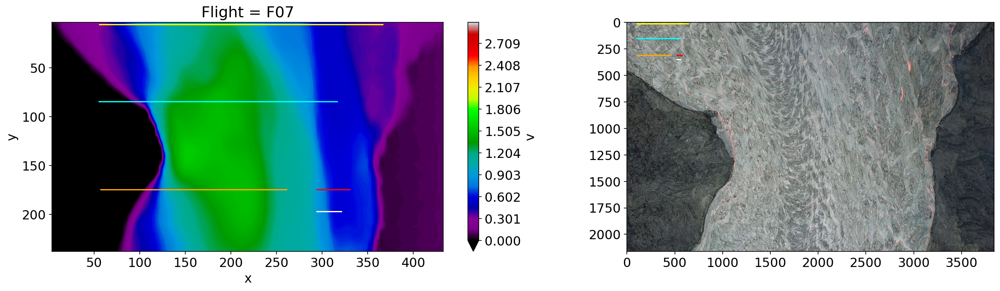

In [25]:
fig,ax = plt.subplots(1,2,figsize=(20,5), gridspec_kw={'width_ratios': [4, 3]})

F07.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3, cmap=cm.nipy_spectral, yincrease=False, ax=ax[0])

ax[0].hlines(50 *GSDy, 485 *GSDx, 3230 *GSDx, colors='yellow')
Yellow_W = (3230-485)*GSDx
print('The width at yellow line :' , Yellow_W , 'm')

ax[0].hlines(750*GSDy, 480*GSDx, 2790*GSDx, colors='cyan')
Cyan_W = (2790-480) *GSDx
print('The width at cyan line :' , Cyan_W  , 'm')

ax[0].hlines(1550 *GSDy, 498 *GSDx, 2300 *GSDx, colors='orange')
Orange_W = (2300-498)*GSDx
print('The width at orange line :' , Orange_W, 'm')

ax[0].hlines(1550 *GSDy, 2580 *GSDx, 2910 *GSDx, colors='red')
Red_W = (2910-2580)*GSDx
print('The width at red line :' , Red_W , 'm')

ax[0].hlines(1750 *GSDy, 2580 *GSDx, 2830 *GSDx, colors='w')
White_W = (2830-2580)*GSDx
print('The width at white line :' , White_W , 'm')

# Plot the original image
ax[1].imshow(frame_F7, aspect='auto')
ax[1].hlines(50*Resize, 485*Resize , 3230*Resize, colors='yellow')
ax[1].hlines(750*Resize, 480*Resize, 2790*Resize, colors='cyan')
ax[1].hlines(1550*Resize, 498*Resize, 2300*Resize , colors='orange')
ax[1].hlines(1550*Resize , 2580*Resize , 2910*Resize , colors='red')
ax[1].hlines(1750*Resize , 2580*Resize , 2830*Resize , colors='w')


### Calculate the velocity at each line

In [14]:
Yellow = F07.mean(dim='time').sel(y= 50 *GSDy, method='nearest')
Yellow = Yellow.v.sel(x=slice(485 *GSDx, 3230 *GSDx))

Cyan = F07.mean(dim='time').sel( y=85, method='nearest')
Cyan = Cyan.v.sel(x=slice(55, 317))

Orange = F07.mean(dim='time').sel( y=1550 *GSDy, method='nearest')
Orange = Orange.v.sel(x=slice(498 *GSDx, 2300 *GSDx))

Red = F07.mean(dim='time').sel( y=1550 *GSDy, method='nearest')
Red = Red.v.sel(x=slice(2580 *GSDx, 2910 *GSDx))

White = F07.mean(dim='time').sel(y= 1750 *GSDy, method='nearest')
White = White.v.sel(x=slice(2580 *GSDx, 2830 *GSDx))


In [15]:
Width_V_Means = (Yellow.mean(), Cyan.mean(), Orange.mean(), Red.mean(), White.mean())
Width_V_Means = np.array(Width_V_Means)

Width_V_Max = (Yellow.max(), Cyan.max(), Orange.max(), Red.max(), White.max())
Width_V_Max = np.array(Width_V_Max)

Widths = (Yellow_W, Cyan_W, Orange_W, Red_W, White_W)
Widths = np.array(Widths)

In [16]:
Width_V_stdv = (Yellow.std(), Cyan.std(), Orange.std(), Red.std(), White.std())
Width_V_stdv = np.array(Width_V_stdv)


Mean Velocity to Channel Width:  y = -0.0014274892529119346 x + 1.3433585765040135
Max velocity to Channel Width:  y = -0.003680712892044425 x + 2.3281573130065407


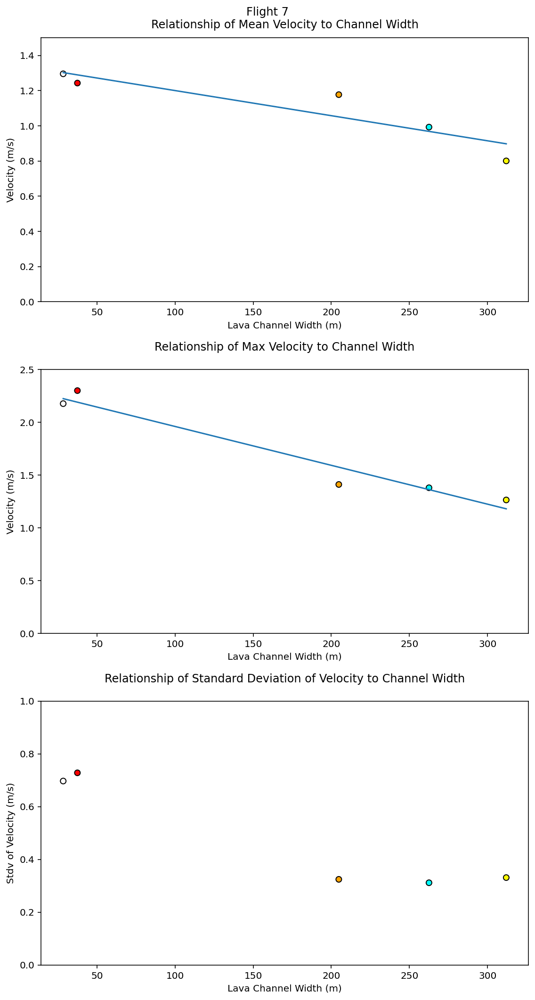

In [17]:
plt.rcParams.update({'font.size': 10})
fig,ax = plt.subplots(3,1,figsize=(8,15))

plt.suptitle('Flight 7')

ax[0].scatter(Widths, Width_V_Means, edgecolor='k', c=('yellow', 'cyan', 'orange', 'red', 'w'))
ax[0].set_ylim(0,1.5)
ax[0].set_title('Relationship of Mean Velocity to Channel Width', pad=10)
ax[0].set_xlabel("Lava Channel Width (m)")
ax[0].set_ylabel('Velocity (m/s)')
m, b = np.polyfit(Widths, Width_V_Means, 1)
ax[0].plot(Widths, m*Widths + b)


ax[1].scatter(Widths, Width_V_Max, edgecolor='k', c=('yellow', 'cyan', 'orange', 'red', 'w'))
ax[1].set_ylim(0,2.5)
ax[1].set_title('Relationship of Max Velocity to Channel Width', pad=20)
ax[1].set_xlabel("Lava Channel Width (m)")
ax[1].set_ylabel('Velocity (m/s)')
mMax, bMax = np.polyfit(Widths, Width_V_Max, 1)
ax[1].plot(Widths, mMax*Widths + bMax)

ax[2].scatter(Widths, Width_V_stdv, edgecolor='k', c=('yellow', 'cyan', 'orange', 'red', 'w'))
ax[2].set_ylim(0,1)
ax[2].set_title('Relationship of Standard Deviation of Velocity to Channel Width', pad=20)
ax[2].set_xlabel("Lava Channel Width (m)")
ax[2].set_ylabel('Stdv of Velocity (m/s)')

plt.tight_layout()
print('Mean Velocity to Channel Width:  y =',m,'x +',b)
print('Max velocity to Channel Width:  y =',mMax,'x +',bMax)

**Mean (Plot 1):** We see a slightly negative correlation between channel width and mean velocity (given these limited data points).

**Max (Plot 2):** We see a slightly stronger negative correlation between channel width and max velocity (again given these limited data points).

**Standard Deviation (Plot 3):** The wider channel has a lower standard deviation on average then the smaller channel

## Animations
### Script 4_Xarray_To_GIF : used to produce GIFs from Xarray

### Display GIF's

In [39]:
#Flight 7 GIF
Image(url= "https://static.wixstatic.com/media/066c76_03076b2424894229975cf6705199f214~mv2.gif",  width=700, height=500)

In [29]:
#Flight 8 GIF
Image(url= "https://static.wixstatic.com/media/066c76_eb12b760154d4e6d8a669f39e1a4931c~mv2.gif",  width=700, height=500)

In [30]:
#Flight 9 GIF
Image(url= "https://static.wixstatic.com/media/066c76_c3772ec4475b483cbc8cd4d28032da01~mv2.gif",  width=700, height=500)

In [31]:
#Flight 10 GIF
Image(url= "https://static.wixstatic.com/media/066c76_b12d6ea5c72a419abeef1d23b57526c0~mv2.gif",  width=700, height=500)


# Some Lessons learned
- What was the average speed of the lava flow?
    - The large channel had an average total velocity (s) of 1.27 m/s, a down stream(v) of 1.26 m/s and  cross stream of 0.05 m/s (to the left). 
    - The smaller channel had an average total velocity (s) of 1.35 m/s.
- Over the course of aproximatly 3.5 hours did flow velocity change signifigantly?
    - There was some velocity variations, but likely within the expected error bars using PIV. The overall averge speed of each flight in order was 0.65, 0.71 , 0.75, 0.79 m/s indicating througout the course of the about 3.5 hours, the channel increased in speed on average. 
- How did the channel width affect flow speeds?
    - Plots above show a slightly negative correlation between lava channel width and mean and max channel velocity.

##  Supplemental Analysis
 Not Part of Presentation

### Overall Average Velocity (including 'still regions') for each Flight

In [14]:
dfx.s.mean(dim='time').mean(dim='x').mean(dim='y')

<xarray.DataArray 's' (Flight: 4)>
array([0.80811138, 0.90780428, 0.85999561, 1.07684618])
Coordinates:
  * Flight   (Flight) object 'F07' 'F08' 'F09' 'F10'

### Overall Average Down Stream Velocity (including 'still regions') for each Flight

In [13]:
dfx.v.mean(dim='time').mean(dim='x').mean(dim='y')

<xarray.DataArray 'v' (Flight: 4)>
array([0.78000979, 0.86893823, 0.83942447, 1.05269356])
Coordinates:
  * Flight   (Flight) object 'F07' 'F08' 'F09' 'F10'

### Velocity Distributions per Flight

Text(0.5, 1.0, 'Flight 10')

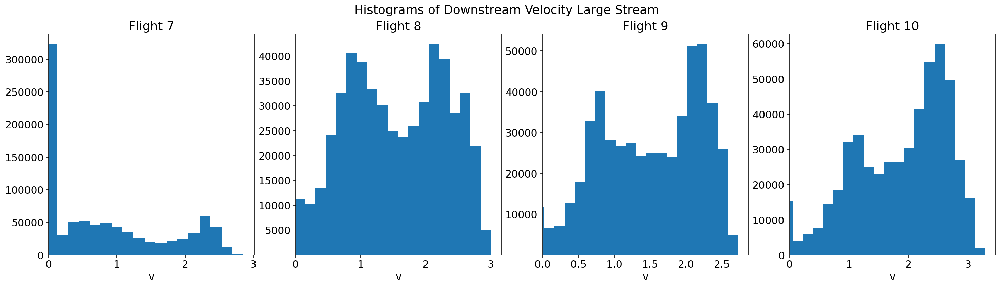

In [27]:

fig, axes = plt.subplots(figsize=(25, 6), ncols=4)
ax1, ax2, ax3, ax4 = axes

plt.suptitle("Histograms of Downstream Velocity Large Stream")

F07.v.sel(x=slice(50,285)).plot.hist(xlim=0, ax=ax1, bins=20  )
ax1.set_title('Flight 7')

F08.v.sel(x=slice(50,285)).plot.hist(xlim=0, ylim=3, ax=ax2, bins=20 )
ax2.set_title('Flight 8')

F09.v.sel(x=slice(50,285)).plot.hist(xlim=-0, ylim=3, ax=ax3, bins=20  )
ax3.set_title('Flight 9')

F10.v.sel(x=slice(50,285)).plot.hist(xlim=0, ax=ax4, bins=20  )
ax4.set_title('Flight 10')


Text(0.5, 1.0, 'Flight 10')

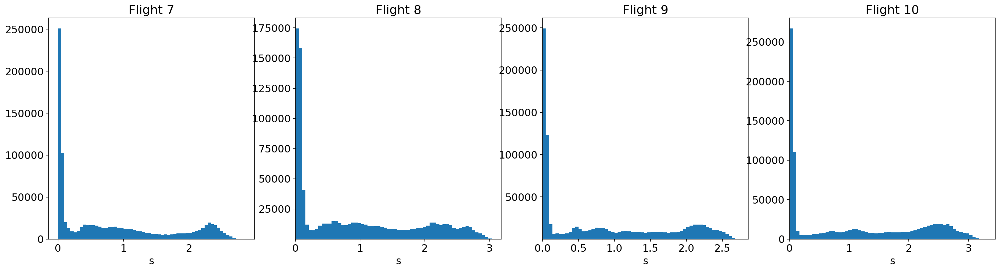

In [33]:
fig, axes = plt.subplots(figsize=(25, 6), ncols=4)
ax1, ax2, ax3, ax4 = axes

F07.s.plot.hist( ax=ax1, bins=60  )
ax1.set_title('Flight 7')

F08.s.plot.hist(xlim=0, ylim=3, ax=ax2, bins=60 )
ax2.set_title('Flight 8')

F09.s.plot.hist(xlim=-0, ylim=3, ax=ax3, bins=60  )
ax3.set_title('Flight 9')

F10.s.plot.hist(xlim=0, ax=ax4, bins=60  )
ax4.set_title('Flight 10')

Text(0.5, 1.0, 'Flight 7')

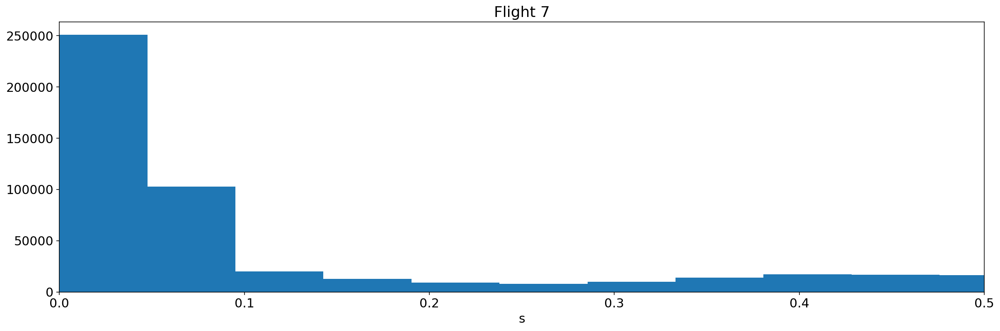

In [43]:
fig, axes = plt.subplots(figsize=(20, 6), ncols=1)
ax1 = axes

F07.s.plot.hist(ax=ax1, xlim=(0,.5), bins=60  )
ax1.set_title('Flight 7')

### Some Measurments

In [46]:
#Average velocity of the flow
bigflow =dfx.where(dfx.s>.15)
print('Mean', bigflow.mean())
print('Standard Deviation', bigflow.std())
print('Max', bigflow.max() )
print('Min', bigflow.min())


Mean <xarray.Dataset>
Dimensions:  ()
Data variables:
    u        float64 0.06586
    v        float64 1.485
    s        float64 1.503
Standard Deviation <xarray.Dataset>
Dimensions:  ()
Data variables:
    u        float64 0.1925
    v        float64 0.7931
    s        float64 0.7857
Max <xarray.Dataset>
Dimensions:  ()
Data variables:
    u        float64 0.7781
    v        float64 3.285
    s        float64 3.287
Min <xarray.Dataset>
Dimensions:  ()
Data variables:
    u        float64 -0.6162
    v        float64 -0.3655
    s        float64 0.15


In [55]:
#Channel Mean Velocity

S7= F07.where(F07.s>.15).mean().values
S8= F08.where(F08.s>.15).mean().values
S9= F09.where(F09.s>.15).mean().values
S10= F10.where(F10.s>.15).mean().values
print('Mean Velocity of the channel in flight order: ', S7,S8,S9,S10, ' (m/s)')

Mean Velocity of the channel in flight order:  <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F07'
Data variables:
    u        float64 0.1291
    v        float64 1.297
    s        float64 1.315> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F08'
Data variables:
    u        float64 0.2164
    v        float64 1.436
    s        float64 1.464> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F09'
Data variables:
    u        float64 0.01405
    v        float64 1.434
    s        float64 1.443> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F10'
Data variables:
    u        float64 -0.1016
    v        float64 1.779
    s        float64 1.794>  (m/s)


- The average flow for all the flights was about 1.503 m/s 

In [56]:
#Channel Max 

S7= F07.where(F07.s>.15).max().values
S8= F08.where(F08.s>.15).max().values
S9= F09.where(F09.s>.15).max().values
S10= F10.where(F10.s>.15).max().values
print('Max Velocity of the channel in flight order: ', S7,S8,S9,S10, ' (m/s)')


Max Velocity of the channel in flight order:  <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F07'
Data variables:
    u        float64 0.5753
    v        float64 2.854
    s        float64 2.854> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F08'
Data variables:
    u        float64 0.7781
    v        float64 3.002
    s        float64 3.036> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F09'
Data variables:
    u        float64 0.4687
    v        float64 2.725
    s        float64 2.726> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F10'
Data variables:
    u        float64 0.5899
    v        float64 3.285
    s        float64 3.287>  (m/s)


In [57]:
#Channel Stdv 

S7= F07.where(F07.s>.15).std().values
S8= F08.where(F08.s>.15).std().values
S9= F09.where(F09.s>.15).std().values
S10= F10.where(F10.s>.15).std().values
print('Stdv Velocity of the channel in flight order: ', S7,S8,S9,S10, ' (m/s)')



Stdv Velocity of the channel in flight order:  <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F07'
Data variables:
    u        float64 0.1239
    v        float64 0.7643
    s        float64 0.755> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F08'
Data variables:
    u        float64 0.1526
    v        float64 0.7937
    s        float64 0.7851> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F09'
Data variables:
    u        float64 0.1269
    v        float64 0.7202
    s        float64 0.7135> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F10'
Data variables:
    u        float64 0.1899
    v        float64 0.8098
    s        float64 0.8047>  (m/s)


In [26]:
#Mean (where values are greater then 0.2 m/s)
S7= F07.where(F07.s>0.2).mean().values
#S8= F08.sel(x=slice(100,360)).mean().values
#S9= F09.sel(x=slice(100,360)).mean().values
#S10= F10.sel(x=slice(100,360)).mean().values
#print('Mean Velocity of small channel in flights order: ', S7,S8,S9,S10, ' (m/s)')
#S_avg = (S7+S8+S9+S10)/4
#print('Overall Mean Velocity of Small Channel for all flights: ', S_avg, 'm/s')
S7

<bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F07'
Data variables:
    u        float64 0.1318
    v        float64 1.325
    s        float64 1.341>

In [33]:
#Mean
S7= F07.sel(x=slice(100,360)).mean().values
S8= F08.sel(x=slice(100,360)).mean().values
S9= F09.sel(x=slice(100,360)).mean().values
S10= F10.sel(x=slice(100,360)).mean().values
print('Mean Velocity of small channel in flights order: ', S7,S8,S9,S10, ' (m/s)')
#S_avg = (S7+S8+S9+S10)/4
#print('Overall Mean Velocity of Small Channel for all flights: ', S_avg, 'm/s')

Mean Velocity of small channel in flights order:  <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F07'
Data variables:
    u        float64 0.15
    v        float64 0.9836
    s        float64 1.026> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F08'
Data variables:
    u        float64 0.1314
    v        float64 1.052
    s        float64 1.086> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F09'
Data variables:
    u        float64 -0.05305
    v        float64 1.113
    s        float64 1.144> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F10'
Data variables:
    u        float64 0.1396
    v        float64 1.156
    s        float64 1.194>  (m/s)


In [35]:
#Standard Deviation
S7= F07.sel(x=slice(100,360)).std().values
S8= F08.sel(x=slice(100,360)).std().values
S9= F09.sel(x=slice(100,360)).std().values
S10= F10.sel(x=slice(100,360)).std().values
print('Standard Deviation of Velocity of  channel in flights order: ', S7,S8,S9,S10, ' (m/s)')
#S_avg = (S7+S8+S9+S10)/4
#print('Overall Mean Velocity of Small Channel for all flights: ', S_avg, 'm/s')

Standard Deviation of Velocity of  channel in flights order:  <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F07'
Data variables:
    u        float64 0.2526
    v        float64 0.3933
    s        float64 0.3953> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F08'
Data variables:
    u        float64 0.2499
    v        float64 0.4364
    s        float64 0.4434> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F09'
Data variables:
    u        float64 0.253
    v        float64 0.4981
    s        float64 0.4952> <bound method Mapping.values of <xarray.Dataset>
Dimensions:  ()
Coordinates:
    Flight   <U3 'F10'
Data variables:
    u        float64 0.2784
    v        float64 0.5132
    s        float64 0.5206>  (m/s)


### Individual Cross Velocity Profiles

Mean thoughout time for the red dot is 2.1921096558795776 m/s
Mean thoughout time for the blue dot is 1.3448816446005822 m/s


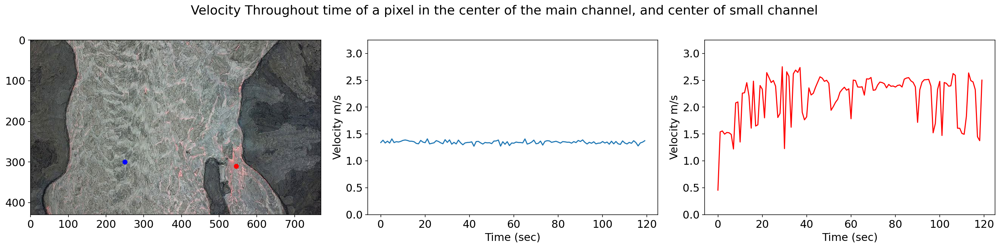

In [18]:
plt.rcParams.update({'font.size': 15})

Large = F07.v.sel(x=150, y=150, method='nearest')
Resize =.2

fig,ax = plt.subplots(1,3,figsize=(20,5))
ax[0].imshow(frame_F7,  aspect='auto')
ax[0].plot(250, 300, 'bo')
ax[0].plot(545,310, 'ro')

Large = F07.v.sel(x=150, y=150, method='nearest')

ax[1].plot(F07.time, Large)
ax[1].set_ylabel('Velocity m/s')
ax[1].set_xlabel('Time (sec)')
ax[1].set_ylim(0,3.25)

plt.suptitle("Velocity Throughout time of a pixel in the center of the main channel, and center of small channel")
plt.tight_layout()

# Pixel at center of smaller channel throughout 2 minutes 
Small = F07.v.sel(x=307, y=165, method='nearest')
ax[2].plot(F07.time, Small, color='red')
ax[2].set_ylim(0,3.25)
ax[2].set_ylabel('Velocity m/s')
ax[2].set_xlabel('Time (sec)')
#ax[2].set_title("Velocity Throughout time of a pixel in the center of the smaller channel")

print('Mean thoughout time for the red dot at F7 is', Small.mean(dim='time').values, 'm/s')
print('Mean thoughout time for the blue dot at F7 is', Large.mean(dim='time').values, 'm/s')

Mean thoughout time for the red dot is 2.2423076312906787 m/s
Mean thoughout time for the blue dot is 1.5057808204780627 m/s


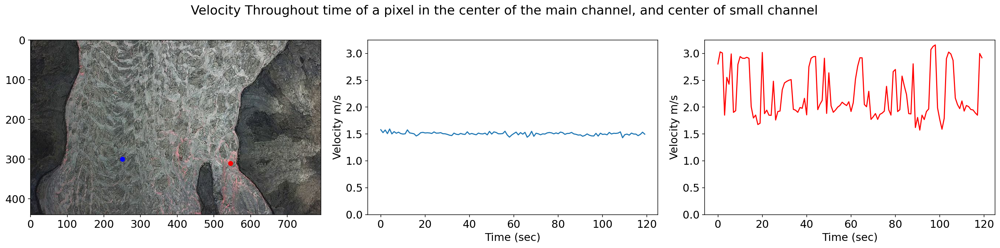

In [22]:
plt.rcParams.update({'font.size': 15})

Large8 = F08.v.sel(x=150, y=160, method='nearest')
Resize =.2

fig,ax = plt.subplots(1,3,figsize=(20,5))
ax[0].imshow(frame_F8,  aspect='auto')
ax[0].plot(250, 300, 'bo')
ax[0].plot(545,310, 'ro')


ax[1].plot(F08.time, Large8)
ax[1].set_ylabel('Velocity m/s')
ax[1].set_xlabel('Time (sec)')
ax[1].set_ylim(0,3.25)

plt.suptitle("Velocity Throughout time of a pixel in the center of the main channel, and center of small channel")
plt.tight_layout()

# Pixel at center of smaller channel throughout 2 minutes 
Small8 = F08.v.sel(x=307, y=175, method='nearest')
ax[2].plot(F08.time, Small8, color='red')
ax[2].set_ylim(0,3.25)
ax[2].set_ylabel('Velocity m/s')
ax[2].set_xlabel('Time (sec)')
#ax[2].set_title("Velocity Throughout time of a pixel in the center of the smaller channel")

print('Mean thoughout time for the red dot at F8 is', Small8.mean(dim='time').values, 'm/s')
print('Mean thoughout time for the blue dot at F8 is', Large8.mean(dim='time').values, 'm/s')

Mean thoughout time for the red dot at F9 is 1.4081775189179018 m/s
Mean thoughout time for the blue dot at F9 is 1.6352910122212643 m/s


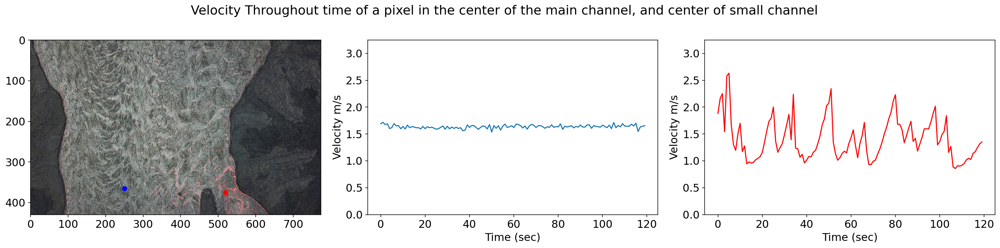

In [22]:
plt.rcParams.update({'font.size': 15})

Large9 = F09.v.sel(x=143, y=170, method='nearest')
Resize =.2

fig,ax = plt.subplots(1,3,figsize=(20,5))
ax[0].imshow(frame_F9,  aspect='auto')
ax[0].plot(250, 365, 'bo')
ax[0].plot(520,375, 'ro')


ax[1].plot(F09.time, Large9)
ax[1].set_ylabel('Velocity m/s')
ax[1].set_xlabel('Time (sec)')
ax[1].set_ylim(0,3.25)

plt.suptitle("Velocity Throughout time of a pixel in the center of the main channel, and center of small channel")
plt.tight_layout()

# Pixel at center of smaller channel throughout 2 minutes 
Small9 = F09.v.sel(x=300, y=185, method='nearest')
ax[2].plot(F09.time, Small9, color='red')
ax[2].set_ylim(0,3.25)
ax[2].set_ylabel('Velocity m/s')
ax[2].set_xlabel('Time (sec)')
#ax[2].set_title("Velocity Throughout time of a pixel in the center of the smaller channel")

print('Mean thoughout time for the red dot at F9 is', Small9.mean(dim='time').values, 'm/s')
print('Mean thoughout time for the blue dot at F9 is', Large9.mean(dim='time').values, 'm/s')

Mean thoughout time for the red dot is 2.5236176379235284 m/s
Mean thoughout time for the blue dot is 1.709095786449278 m/s


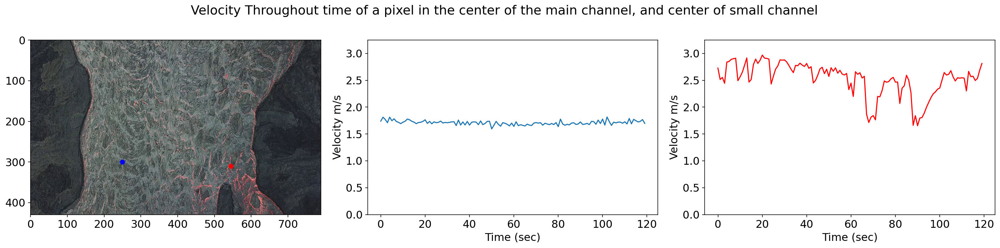

In [28]:
plt.rcParams.update({'font.size': 15})

Large10 = F10.v.sel(x=160, y=180, method='nearest')
Resize =.2

fig,ax = plt.subplots(1,3,figsize=(20,5))
ax[0].imshow(frame_F10,  aspect='auto')
ax[0].plot(250, 300, 'bo')
ax[0].plot(545,310, 'ro')


ax[1].plot(F10.time, Large10)
ax[1].set_ylabel('Velocity m/s')
ax[1].set_xlabel('Time (sec)')
ax[1].set_ylim(0,3.25)

plt.suptitle("Velocity Throughout time of a pixel in the center of the main channel, and center of small channel")
plt.tight_layout()

# Pixel at center of smaller channel throughout 2 minutes 
Small10 = F10.v.sel(x=330, y=205, method='nearest')
ax[2].plot(F10.time, Small10, color='red')
ax[2].set_ylim(0,3.25)
ax[2].set_ylabel('Velocity m/s')
ax[2].set_xlabel('Time (sec)')
#ax[2].set_title("Velocity Throughout time of a pixel in the center of the smaller channel")

print('Mean thoughout time for the red dot at F10 is', Small10.mean(dim='time').values, 'm/s')


print('Mean thoughout time for the blue dot at F10 is', Large10.mean(dim='time').values, 'm/s')

In [4]:
from platform import python_version

print(python_version())

3.8.3
